# Notebook to load clustering results and compare them to reference SEDs (such as CWW-Kinney in LePhare)

Created on : Feb. 6, 2023 by Joseph Chevalier

Last update : Feb. 6, 2023 by Joseph Chevalier

## Imports and settings

In [1]:
import os, sys, re
import pickle
import json
import glob
import collections

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib.offsetbox
from matplotlib.backends.backend_pdf import PdfPages
%matplotlib inline
# to enlarge the sizes
params = {'legend.fontsize': 'large',
          'figure.figsize': (12, 8),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
plt.rcParams.update(params)
props = dict(boxstyle='round',edgecolor="w",facecolor="w", alpha=0.5)

from itertools import cycle, islice

from astropy.io import fits
from astropy.table import Table
from scipy import ndimage
from scipy.interpolate import interp1d

# Import the primary photometry classes from rubin_sim.photUtils
from rubin_sim.phot_utils import Bandpass
from rubin_sim.phot_utils import Sed
from rubin_sim.data import get_data_dir
from StudyFors2SED.def_raw_seds import *
#from StudyFors2SED.raw_data_analysis import *

pysynphot_root_path=os.environ['PYSYN_CDBS']
path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
# pysynphot
import pysynphot as S
S.refs.setref(area=1)
S.refs.getref()

{'graphtable': '/home/joseph/local/dir/trds/mtab/57g1733im_tmg.fits',
 'comptable': '/home/joseph/local/dir/trds/mtab/6452249tm_tmc.fits',
 'thermtable': '/home/joseph/local/dir/trds/mtab/3241637sm_tmt.fits',
 'area': 1,
 'waveset': 'Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True'}

In [2]:
def SaveImageInPdf(all_figs,outputfile):
    """
    """
    with PdfPages(outputfile) as pdf:
        for fig in all_figs:
            pdf.savefig(fig)
            plt.close()

In [3]:
root_dir, base_name = os.path.split(os.getcwd())
print(root_dir)

/home/joseph


In [4]:
os.listdir(root_dir)

['.python_history',
 '.condarc',
 'AuxtelEnv',
 'rubin_sim',
 'rubin_sim_data',
 '.stackyter-config.yaml',
 '.landscape',
 '.sudo_as_admin_successful',
 '.gitconfig',
 'Downloads',
 '.conda',
 'PhotoZEnv',
 '.cache',
 '.bash_history',
 '.nedit',
 'anaconda3',
 '.wget-hsts',
 'Spectractor',
 '.motd_shown',
 '.config',
 '.astropy',
 'Anaconda3-2022.10-Linux-x86_64.sh',
 'delegate-contributions-dp02',
 'StackyterEnv',
 'WIP_FORS2',
 '.profile',
 '.jupyter',
 '.ssh',
 '.bash_logout',
 'GMAOMERRA2',
 '.viminfo',
 '.bashrc',
 '.bash_aliases',
 '.mozilla',
 'AuxTelComm',
 '.local',
 'libRadtran',
 'lephare_cosmos',
 'AuxTel_eqw',
 'PhotoZ_PhD',
 'libRadtran-2.0.4.tar.gz',
 'local',
 '.ipython',
 '.dbus']

In [5]:
filename_fits_catalog
t = Table.read(filename_fits_catalog)
t[t["ID"]==106]['z'][0]

/home/joseph/anaconda3/envs/conda_photoZ/lib/python3.11/site-packages/astropy/io/fits/connect.py:276: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask = data[col.name] == col.null


0.6436

In [6]:
print(path_BC)
spec_list = sorted(os.listdir(path_BC))
print(spec_list)

/home/joseph/PhotoZ_PhD/ResStarlight/BC03N/conf1/HZ4/output_rebuild_BC/full_spectra/
['SPEC102_HZ4_BC.txt', 'SPEC106_HZ4_BC.txt', 'SPEC107_HZ4_BC.txt', 'SPEC109_HZ4_BC.txt', 'SPEC110_HZ4_BC.txt', 'SPEC111_HZ4_BC.txt', 'SPEC112_HZ4_BC.txt', 'SPEC113_HZ4_BC.txt', 'SPEC114_HZ4_BC.txt', 'SPEC115_HZ4_BC.txt', 'SPEC117_HZ4_BC.txt', 'SPEC118_HZ4_BC.txt', 'SPEC120_HZ4_BC.txt', 'SPEC121_HZ4_BC.txt', 'SPEC123_HZ4_BC.txt', 'SPEC127_HZ4_BC.txt', 'SPEC128_HZ4_BC.txt', 'SPEC132_HZ4_BC.txt', 'SPEC134_HZ4_BC.txt', 'SPEC135_HZ4_BC.txt', 'SPEC137_HZ4_BC.txt', 'SPEC138_HZ4_BC.txt', 'SPEC13_HZ4_BC.txt', 'SPEC141_HZ4_BC.txt', 'SPEC149_HZ4_BC.txt', 'SPEC151_HZ4_BC.txt', 'SPEC152_HZ4_BC.txt', 'SPEC156_HZ4_BC.txt', 'SPEC160_HZ4_BC.txt', 'SPEC161_HZ4_BC.txt', 'SPEC164_HZ4_BC.txt', 'SPEC171_HZ4_BC.txt', 'SPEC178_HZ4_BC.txt', 'SPEC179_HZ4_BC.txt', 'SPEC181_HZ4_BC.txt', 'SPEC182_HZ4_BC.txt', 'SPEC183_HZ4_BC.txt', 'SPEC184_HZ4_BC.txt', 'SPEC185_HZ4_BC.txt', 'SPEC186_HZ4_BC.txt', 'SPEC187_HZ4_BC.txt', 'SPEC188_HZ4_

In [7]:
all_numbers = [ int(re.findall('^SPEC(.*)_HZ4_BC[.]txt$',fn)[0]) for fn in spec_list ]
all_numbers = sorted(all_numbers)
all_numbers

[2,
 3,
 9,
 13,
 19,
 24,
 25,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 45,
 47,
 49,
 51,
 55,
 57,
 58,
 59,
 61,
 62,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 77,
 79,
 80,
 83,
 84,
 85,
 86,
 87,
 89,
 91,
 93,
 96,
 97,
 102,
 106,
 107,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 117,
 118,
 120,
 121,
 123,
 127,
 128,
 132,
 134,
 135,
 137,
 138,
 141,
 149,
 151,
 152,
 156,
 160,
 161,
 164,
 171,
 178,
 179,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 191,
 192,
 193,
 194,
 196,
 197,
 198,
 204,
 205,
 210,
 214,
 218,
 221,
 222,
 223,
 226,
 227,
 231,
 233,
 234,
 235,
 236,
 237,
 238,
 240,
 242,
 243,
 244,
 245,
 246,
 248,
 249,
 250,
 252,
 253,
 258,
 259,
 260,
 261,
 262,
 264,
 265,
 266,
 267,
 268,
 271,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 287,
 288,
 291,
 292,
 294,
 295,
 296,
 297,
 298,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 313,
 315,
 317,
 318,
 319,
 321,
 322,
 323,
 324,
 325,
 326,
 327,
 328,

## Load clustering results

In [8]:
clus_dict_file = 'clustersFromSL_Kmean.pkl'
path_to_pickle = os.path.join(os.getcwd(), 'Clustering', clus_dict_file)
print(path_to_pickle)

/home/joseph/PhotoZ_PhD/Clustering/clustersFromSL_Kmean.pkl


In [9]:
with open(path_to_pickle, 'rb') as f:
    clus_dict = pickle.load(f)
print(clus_dict)

{'KmeanCluster_SL_1': [68, 298, 385, 444, 448, 461, 468, 480, 499, 541, 548, 568, 647, 654, 686, 699], 'KmeanCluster_SL_2': [37, 234, 258, 275, 362, 389, 392, 418, 460, 542, 569, 584, 596, 628, 636, 652, 692], 'KmeanCluster_SL_3': [109, 110, 152, 156, 164, 196, 264, 283, 305, 325, 331, 337, 386, 390, 405, 413, 414, 420, 445, 531, 557, 599, 604, 612, 629, 633, 640, 691, 715, 724], 'KmeanCluster_SL_4': [33, 35, 55, 62, 182, 186, 277, 288, 303, 318, 334, 335, 349, 351, 355, 358, 359, 378, 379, 391, 398, 410, 417, 429, 438, 490, 493, 494, 501, 506, 519, 520, 528, 530, 554, 560, 565, 566, 576, 598, 603, 605, 617, 637, 648, 649, 663, 667, 681, 685, 711, 716, 718, 720, 721, 738], 'KmeanCluster_SL_5': [242, 291, 295, 415, 432, 447, 474, 585, 589, 650, 671], 'KmeanCluster_SL_6': [508, 525, 540], 'KmeanCluster_SL_7': [67, 79, 112, 115, 185, 243, 250, 315, 327, 328, 332, 333, 340, 345, 367, 369, 371, 408, 411, 440, 449, 559, 573, 608, 611, 664, 668, 669, 684, 694, 697, 713], 'KmeanCluster_SL_8': 

# Loop on dictionary and its components to compute an average spectrum

In [10]:
df_avg_spec = pd.DataFrame()
df_avg_spec_normed = pd.DataFrame()
lambdas = np.arange(0., 6.0e+05, 10)
df_avg_spec['Wavelength'] = lambdas
df_avg_spec_normed['Wavelength'] = lambdas
new_clus_dict={}
avg_zs = np.empty_like([])
sigma_zs = np.empty_like([])
for key in clus_dict:
    _redshifts = np.empty_like([])
    _spec_arr = np.empty_like(lambdas)
    _normSpec_arr = np.empty_like(lambdas)
    Nspec = len(clus_dict[key])
    _dict = {}
    _dict['ID'] = clus_dict[key]
    
    for spec_id in clus_dict[key]:
        spec_path = os.path.join(path_BC, f'SPEC{spec_id}_HZ4_BC.txt')
        spec_arr = np.loadtxt(spec_path)
        spec_fonc = interp1d(spec_arr[:-1, 0], spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        lumins = spec_fonc(lambdas)
        mask = (lambdas >= 0.)*(lambdas <= 10000.)
        _norm = np.trapz(lumins[mask], lambdas[mask])
        normed_spec = lumins/_norm
        _redshifts = np.append(_redshifts, t[t['ID']==spec_id]['z'][0])
        _spec_arr = np.column_stack((_spec_arr, lumins))
        _normSpec_arr = np.column_stack((_normSpec_arr, normed_spec))
    
    _dict['z_s'] = _redshifts.tolist()
    new_clus_dict[key] = _dict
    _avg_z = np.mean(_redshifts)
    avg_zs = np.append(avg_zs, _avg_z)
    _sigma_z = np.std(_redshifts)
    sigma_zs = np.append(sigma_zs, _sigma_z)
    _spec_arr = _spec_arr[:,1:]
    _normSpec_arr = _normSpec_arr[:,1:]
    avg_spec = np.mean(_spec_arr, axis=1, dtype=np.float64)
    sigma_spec = np.std(_spec_arr, axis=1, dtype=np.float64)
    avg_normed_spec = np.mean(_normSpec_arr, axis=1, dtype=np.float64)
    sigma_normed_spec = np.std(_normSpec_arr, axis=1, dtype=np.float64)
    df_avg_spec[f'AVG_{key}'] = avg_spec
    df_avg_spec[f'SIG_{key}'] = sigma_spec
    df_avg_spec_normed[f'AVG_{key}_normed'] = avg_normed_spec
    df_avg_spec_normed[f'SIG_{key}_normed'] = sigma_normed_spec
#new_clus_dict

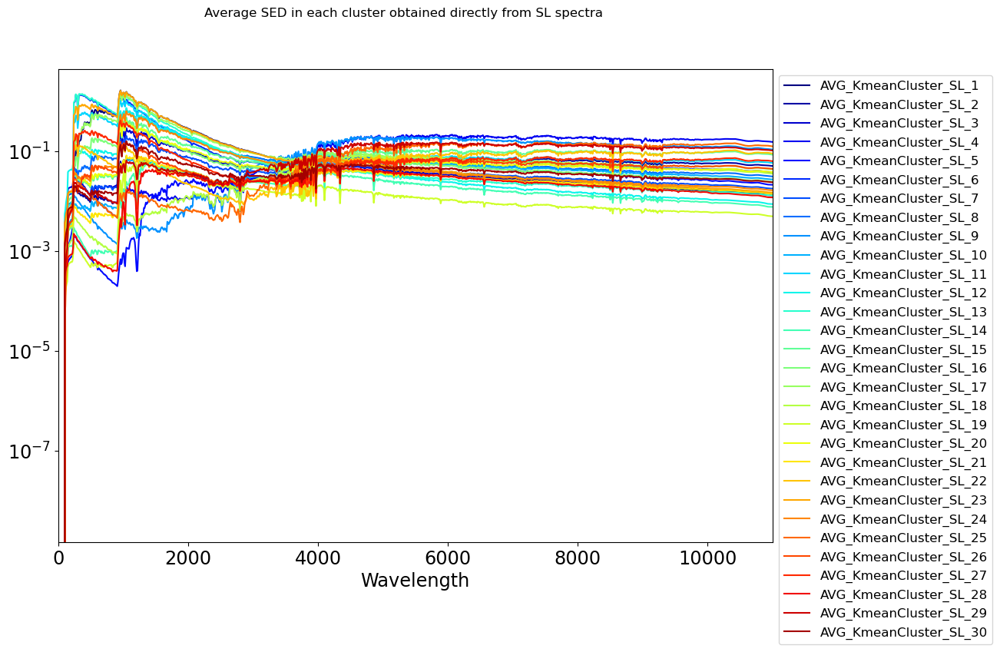

In [11]:
f, a = plt.subplots(1,1)
NTOPLOT=len(df_avg_spec.columns[1:])
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=NTOPLOT)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors_clu = scalarMap.to_rgba(np.arange(NTOPLOT), alpha=1)
for idy in np.arange(1, len(df_avg_spec.columns[1:])+1):
    key = str(df_avg_spec.columns[idy])
    if 'AVG' in key:
        df_avg_spec.plot('Wavelength', key, ax=a, color=all_colors_clu[idy-1], legend=False)
    a.set_yscale('log')
    a.legend(loc='upper left', bbox_to_anchor=(1.,1.))
    f.suptitle('Average SED in each cluster obtained directly from SL spectra')
    #a.set_xscale('log')
    a.set_xlim(0,11000)

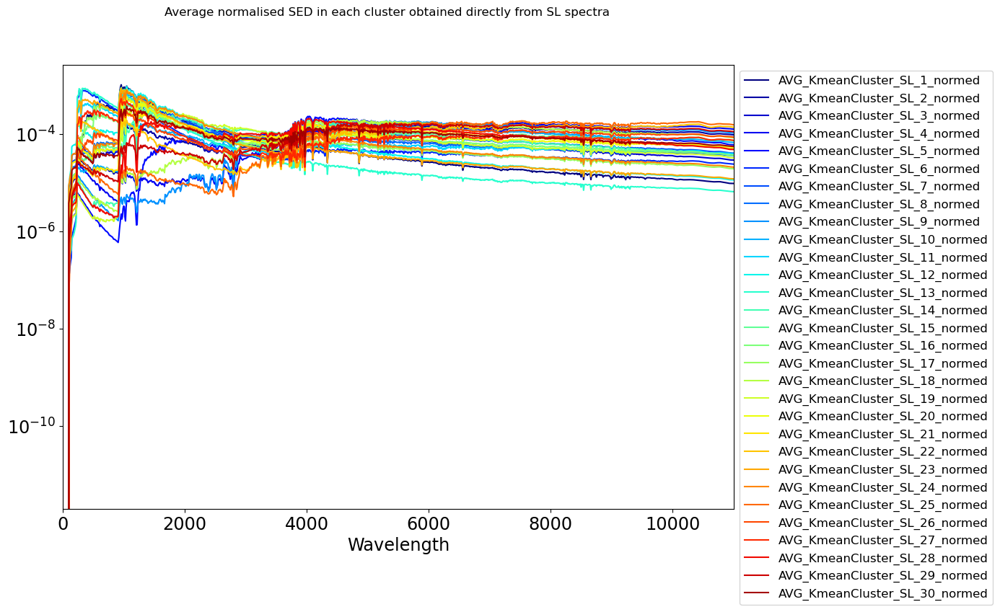

In [12]:
f, a = plt.subplots(1,1)
for idy in np.arange(1, len(df_avg_spec_normed.columns[1:])+1):
    key = str(df_avg_spec_normed.columns[idy])
    if 'AVG' in key:
        df_avg_spec_normed.plot('Wavelength', key, ax=a, color=all_colors_clu[idy-1], legend=False)
    a.set_yscale('log')
    a.legend(loc='upper left', bbox_to_anchor=(1.,1.))
    f.suptitle('Average normalised SED in each cluster obtained directly from SL spectra')
    #a.set_xscale('log')
    a.set_xlim(0,11000)

## Load CWW-Kinney data from files in LEPHARE

In [13]:
if os.getenv('LEPHAREDIR') is not None:
    LEPHAREDIR = os.getenv('LEPHAREDIR')
else:
    LEPHAREDIR = os.path.abspath(os.path.join(os.getcwd(), "LEPHARE"))
print(LEPHAREDIR)
ref_seds = 'CWW_KINNEY'
sed_dir = os.path.join(LEPHAREDIR, 'sed/GAL', ref_seds)
print(sed_dir)

/home/joseph/PhotoZ_PhD/LEPHARE
/home/joseph/PhotoZ_PhD/LEPHARE/sed/GAL/CWW_KINNEY


In [14]:
fmt='.sed'
seds = []
for f in os.listdir(sed_dir):
    if fmt in f:
        seds.append(f)
print(seds)

['CWW_Sbc_ext.sed', 'KIN_SB2_ext.sed', 'KIN_SB3_ext.sed', 'KIN_SB6_ext.sed', 'KIN_SB5_ext.sed', 'KIN_SB4_ext.sed', 'CWW_E_ext.sed', 'CWW_Im_ext.sed', 'KIN_SB1_ext.sed', 'CWW_Scd_ext.sed', 'KIN_Sb_ext.sed', 'KIN_Sa_ext.sed']


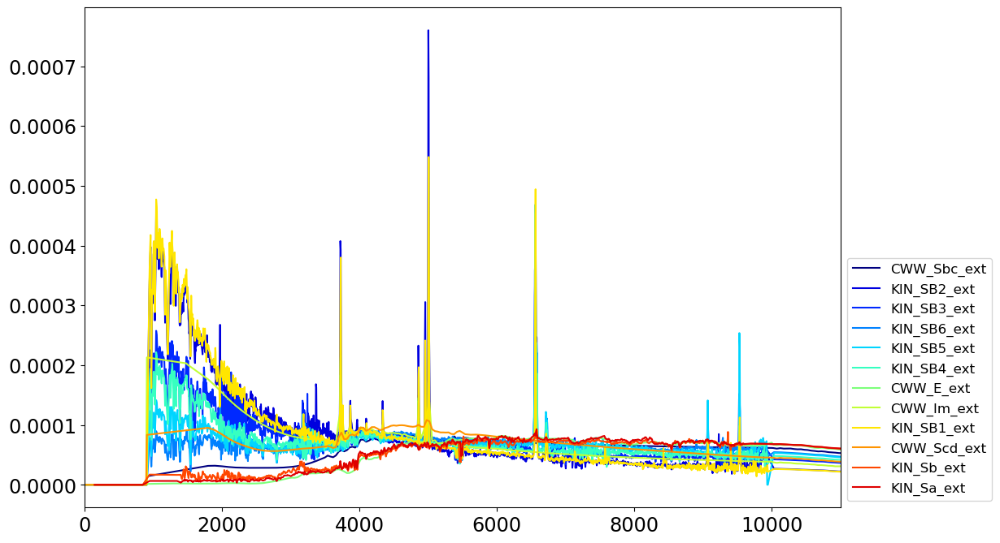

In [15]:
NrefSEDs=len(seds)
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=NrefSEDs)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors_refs = scalarMap.to_rgba(np.arange(NrefSEDs), alpha=1)

f, a = plt.subplots(1,1)
for sed, c in zip(seds, all_colors_refs):
    sed_arr = np.loadtxt(os.path.join(sed_dir, sed))
    mask = (sed_arr[:,0] >= 0.) * (sed_arr[:,1] <= 10000.)
    norm = np.trapz(sed_arr[:,1][mask], sed_arr[:,0][mask])
    a.plot(sed_arr[:, 0], sed_arr[:, 1]/norm, label=sed.split('.')[0], color=c)

a.set_xlim(0., 11000.)
#a.set_yscale('log')
a.legend(loc='lower left', bbox_to_anchor = (1., 0.))

In [16]:
df_cww_spec = pd.DataFrame()
df_cww_spec_normed = pd.DataFrame()
df_cww_spec['Wavelength'] = lambdas
df_cww_spec_normed['Wavelength'] = lambdas
for sed in seds:
    spec_path = os.path.join(sed_dir, sed)
    spec_arr = np.loadtxt(spec_path)
    spec_fonc = interp1d(spec_arr[:-1, 0], spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
    lumins = spec_fonc(lambdas)
    mask = (lambdas >= 0.)*(lambdas <= 10000.)
    _norm = np.trapz(lumins[mask], lambdas[mask])
    normed_spec = lumins/_norm
    df_cww_spec[ sed.split('.')[0] ] = lumins
    df_cww_spec_normed[ f"{sed.split('.')[0]}_norm" ] = normed_spec
sorted(df_cww_spec_normed.keys())

['CWW_E_ext_norm',
 'CWW_Im_ext_norm',
 'CWW_Sbc_ext_norm',
 'CWW_Scd_ext_norm',
 'KIN_SB1_ext_norm',
 'KIN_SB2_ext_norm',
 'KIN_SB3_ext_norm',
 'KIN_SB4_ext_norm',
 'KIN_SB5_ext_norm',
 'KIN_SB6_ext_norm',
 'KIN_Sa_ext_norm',
 'KIN_Sb_ext_norm',
 'Wavelength']

## Plot SEDs from clustering vs. CWW-Kinney

/tmp/ipykernel_3191/170073640.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1)


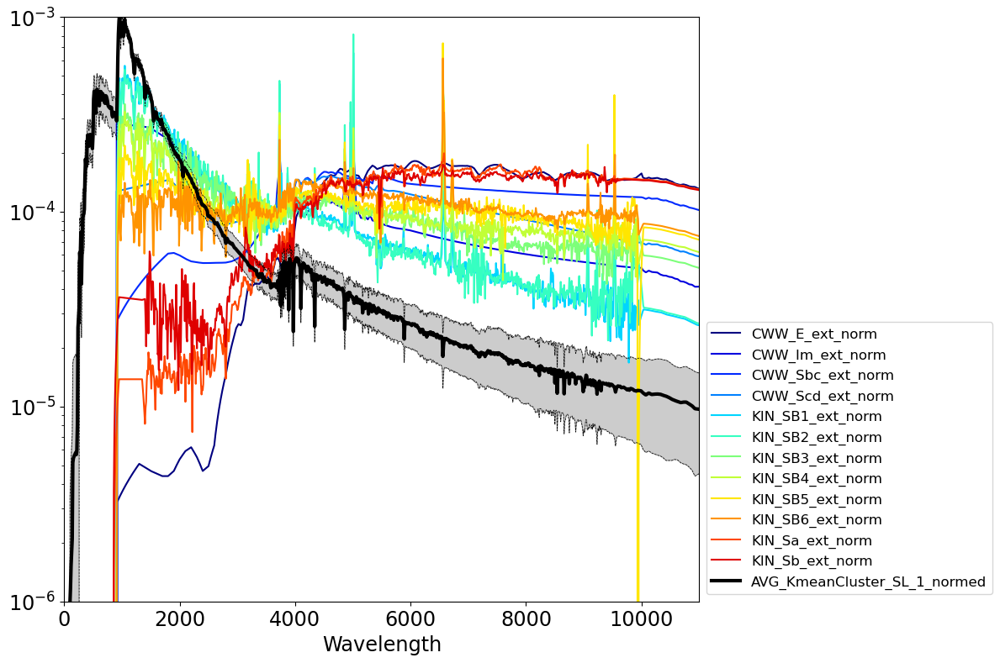

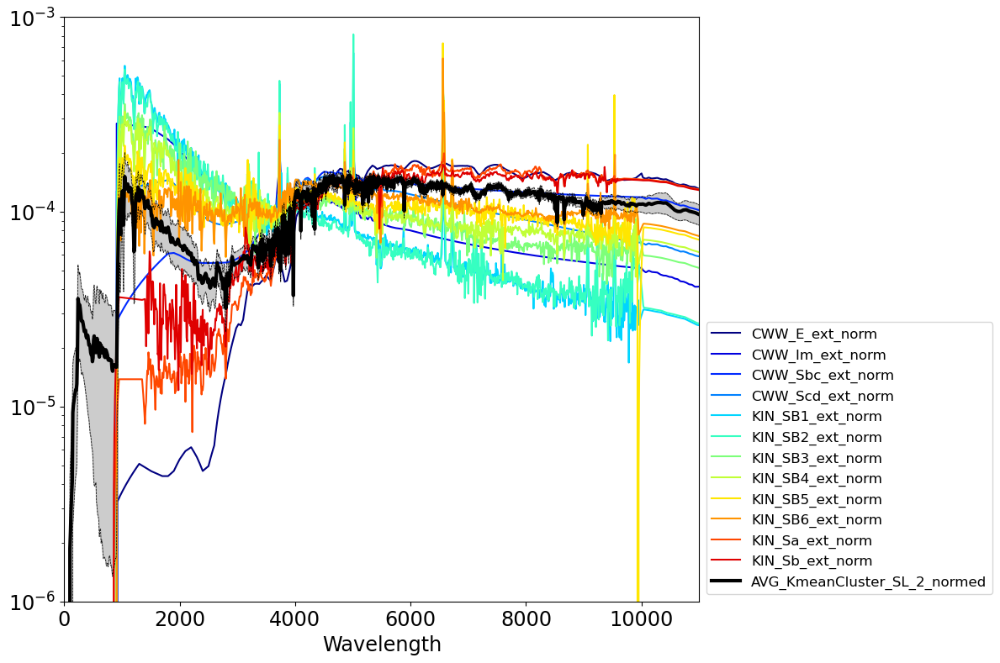

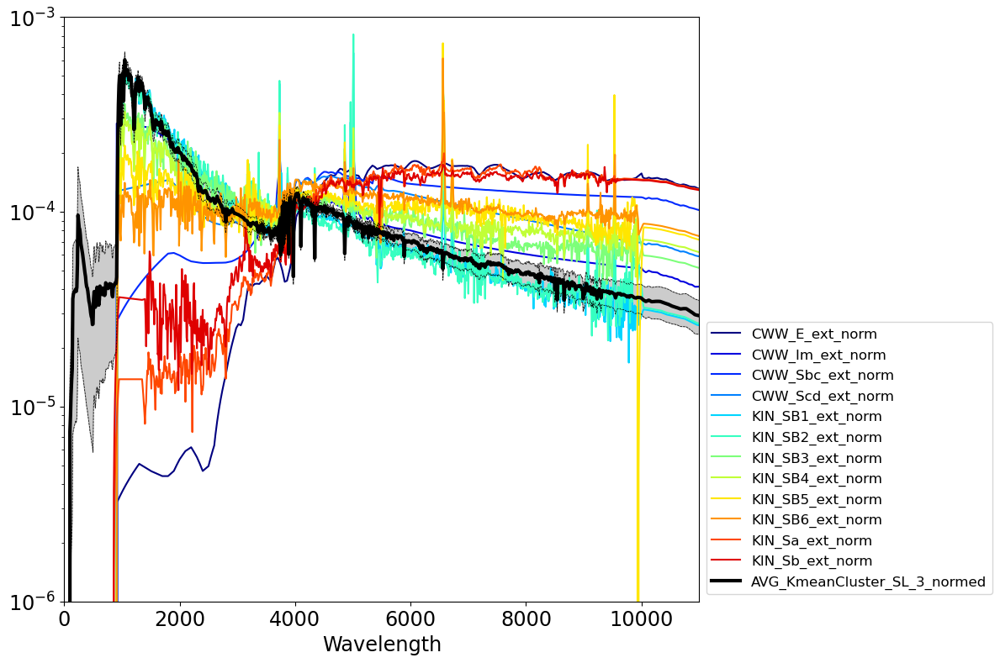

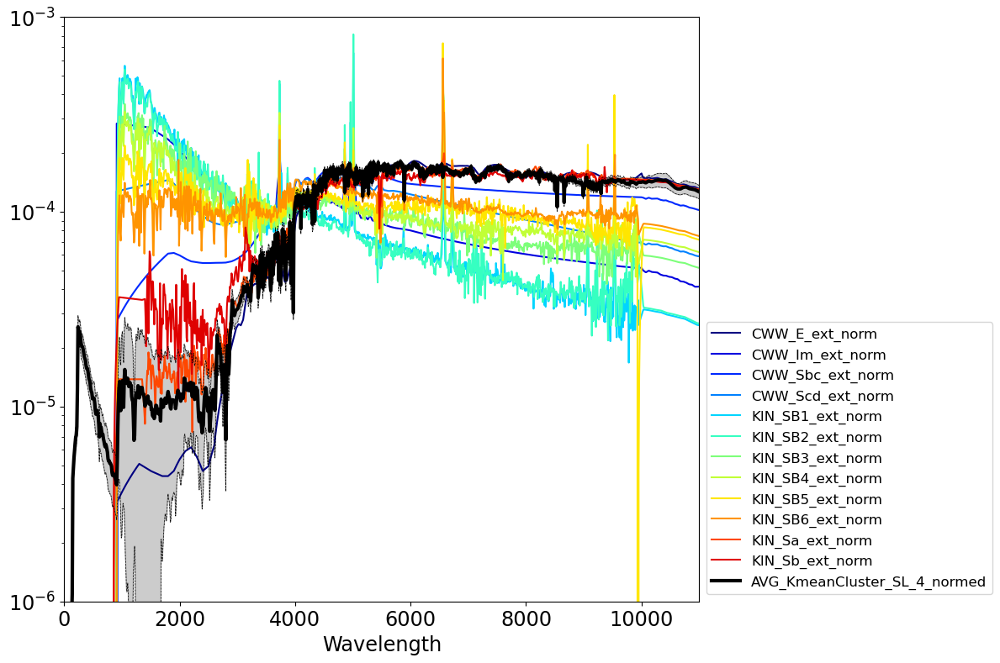

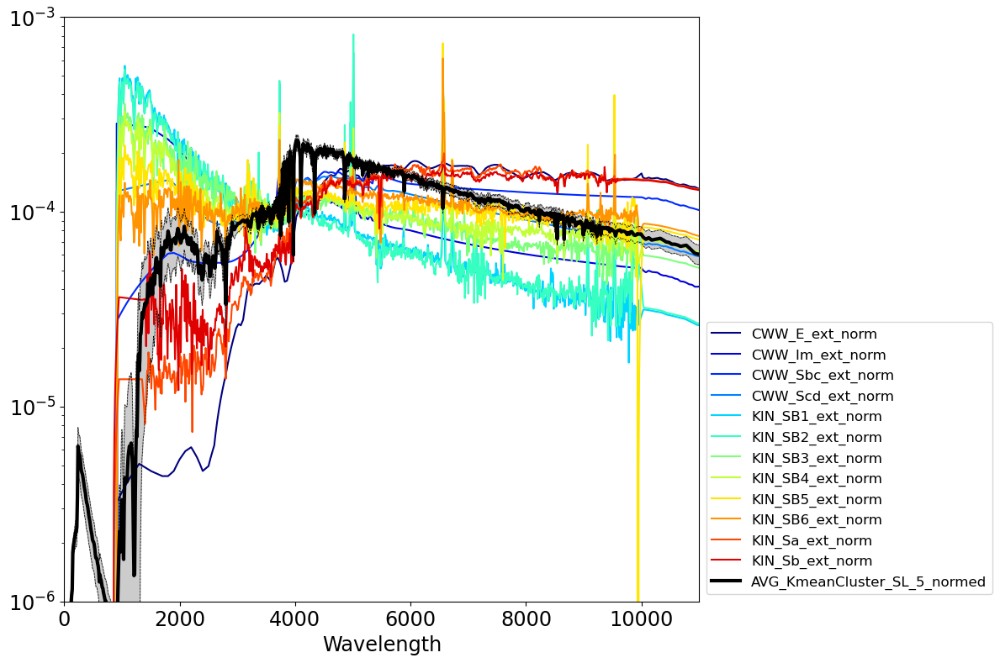

...

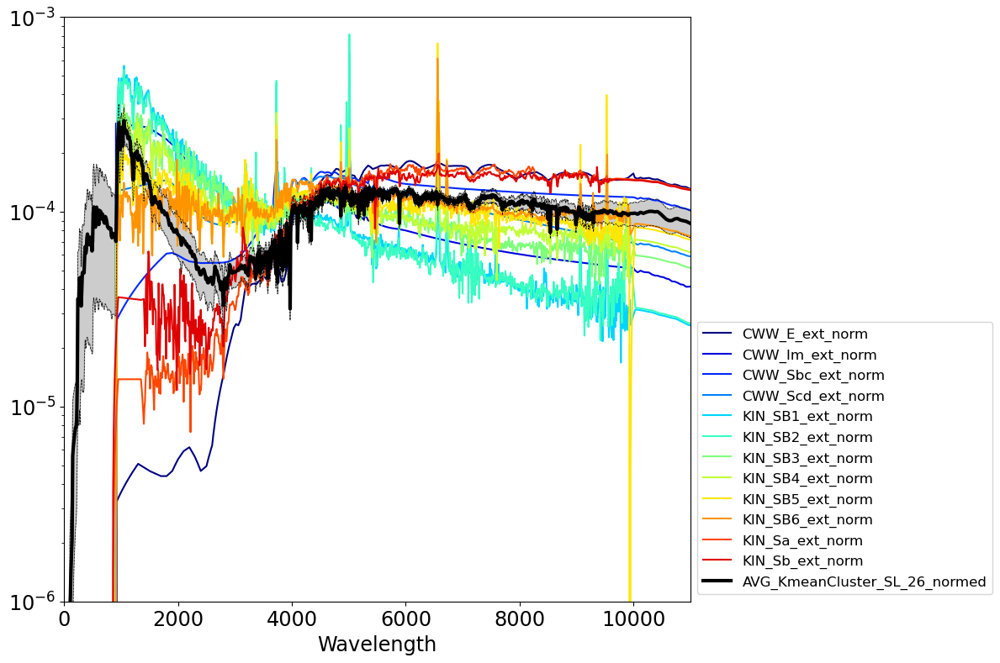

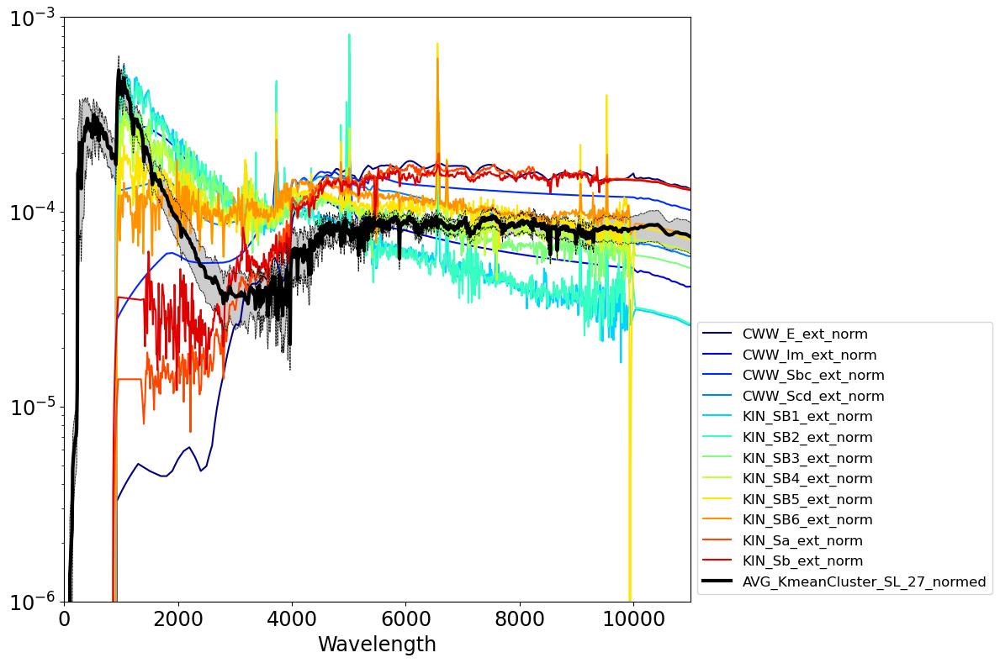

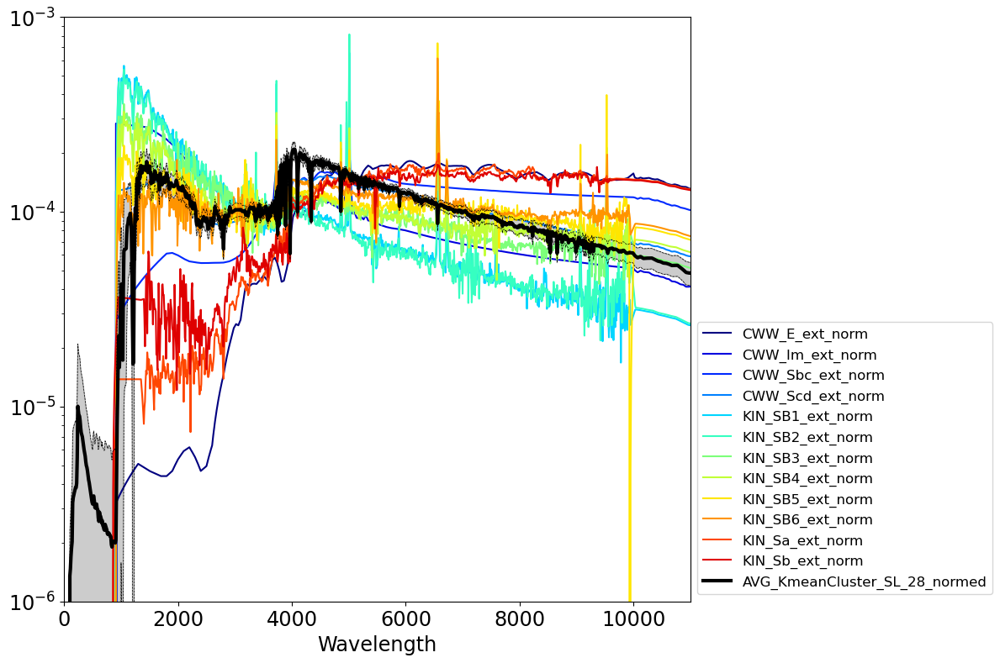

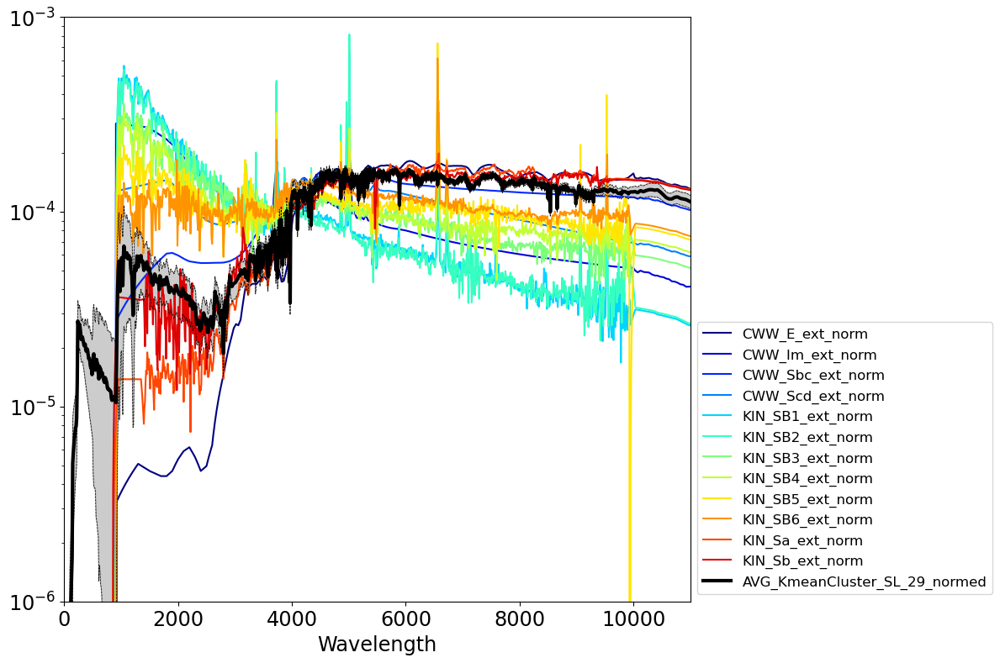

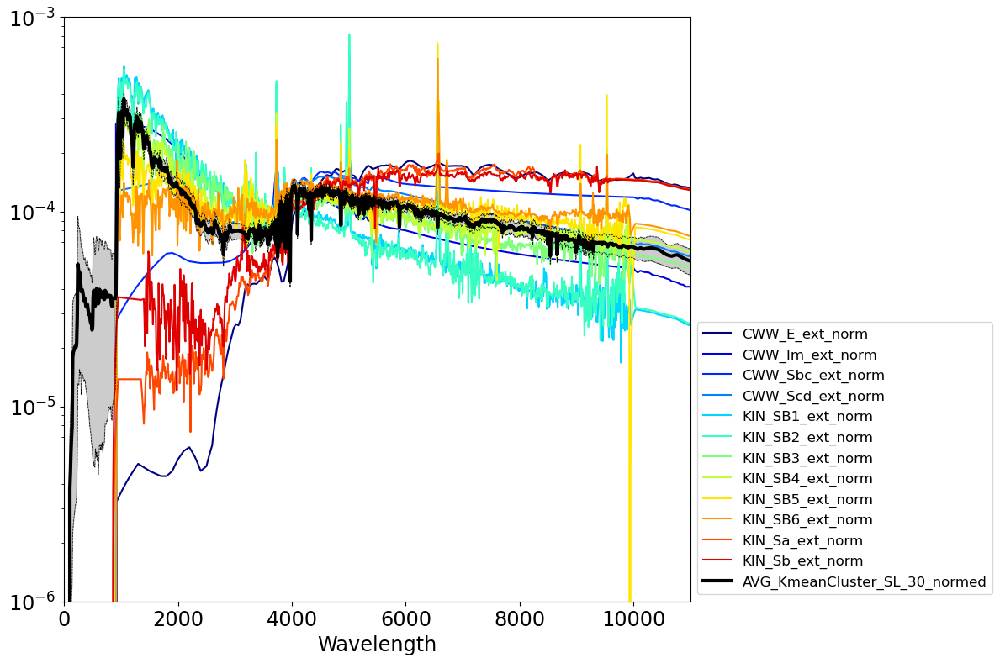

In [17]:
_figs_plot = []
for key in df_avg_spec_normed.keys()[1:]:
    if 'AVG' in key:
        _list = key.split('_')[1:]
        _list.insert(0, 'SIG')
        _sig_key = '_'.join(_list)
        fig, ax = plt.subplots(1,1)
        df_cww_spec_normed.plot('Wavelength', sorted(df_cww_spec_normed.keys()[1:]), ax=ax, color=all_colors_refs, legend=False)
        df_avg_spec_normed.plot('Wavelength', key, ax=ax, legend=False, color='k', linewidth=3)
        ax.plot(df_avg_spec_normed['Wavelength'], df_avg_spec_normed[key]+df_avg_spec_normed[_sig_key],\
                color='k', ls='--', linewidth=.5)
        ax.plot(df_avg_spec_normed['Wavelength'], df_avg_spec_normed[key]-df_avg_spec_normed[_sig_key],\
                color='k', ls='--', linewidth=.5)
        ax.fill_between(df_avg_spec_normed['Wavelength'],\
                        df_avg_spec_normed[key]-df_avg_spec_normed[_sig_key],\
                        df_avg_spec_normed[key]+df_avg_spec_normed[_sig_key],\
                        color='k', alpha=.2)
        ax.set_xlim(0, 11000)
        ax.set_ylim(1.0e-6, 1.0e-3)
        ax.set_yscale('log')
        ax.legend(loc='lower left', bbox_to_anchor=(1.,0.))
        fig.set_tight_layout(True)
        _figs_plot.append(fig)

In [18]:
if False:
    pdfoutputfilename = "KmeanClusAvgSEDs_vs_CWW.pdf"
    SaveImageInPdf(_figs_plot,pdfoutputfilename)

## Define a distance between two spectra

In [19]:
def dist_spec(spec_arr, refSpec_arr, lambdas, lambda_min=0., lambda_max=10000., lambda_step=10.):
    mask = (lambdas>=lambda_min) * (lambdas<= lambda_max)
    _diff = np.power(spec_arr[mask]-refSpec_arr[mask], 2.)
    dist = np.power(np.sum(_diff), 0.5)
    return dist

In [20]:
key_test = sorted(df_avg_spec_normed.keys()[1:])[0]
dist_arr_test = [ dist_spec(df_avg_spec_normed[key_test], df_cww_spec_normed[key_ref],\
                           lambdas=np.array(df_avg_spec_normed['Wavelength'])\
                          ) for key_ref in sorted(df_cww_spec_normed.keys()[1:]) ]

In [21]:
closest = np.array(sorted(df_cww_spec_normed.keys()[1:]))[ np.where(dist_arr_test == np.min(dist_arr_test))[0]][0]
closest

'CWW_Scd_ext_norm'

In [22]:
refs_arr = np.array(sorted(df_cww_spec_normed.keys()[1:]))
templates_arr = np.array(list(clus_dict.keys()))
print(templates_arr)
distances_to_ref = np.empty_like([])
closest_refs = np.empty_like([])
df_refs_dist = pd.DataFrame(index=templates_arr)
df_refs_dist['N_FORS2'] = [len(clus_dict[key]) for key in clus_dict]
df_refs_dist['Template_label'] = [f'AVG_{key}_normed' for key in clus_dict]
df_refs_dist['avg_z'] = avg_zs
df_refs_dist['sigma_z'] = sigma_zs
for key in df_refs_dist.index:
    _dist_arr = [ dist_spec(df_avg_spec_normed[df_refs_dist.loc[key, 'Template_label']],\
                            df_cww_spec_normed[key_ref],\
                            lambdas=np.array(df_cww_spec_normed['Wavelength'])\
                            ) for key_ref in refs_arr ]
    _labels = [f"dist_to_{ref.split('_')[0]+'_'+ref.split('_')[1]}" for ref in refs_arr]
    df_refs_dist.loc[key, _labels] = _dist_arr
    _min_dist = np.min(_dist_arr)
    _sel_min = np.where(_dist_arr == _min_dist)[0]
    distances_to_ref = np.append(distances_to_ref, _min_dist)
    closest_refs = np.append(closest_refs, refs_arr[_sel_min])
df_refs_dist['Nearest_SED'] = closest_refs
df_refs_dist['Distance_to_nearest'] = distances_to_ref
df_refs_dist

['KmeanCluster_SL_1' 'KmeanCluster_SL_2' 'KmeanCluster_SL_3'
 'KmeanCluster_SL_4' 'KmeanCluster_SL_5' 'KmeanCluster_SL_6'
 'KmeanCluster_SL_7' 'KmeanCluster_SL_8' 'KmeanCluster_SL_9'
 'KmeanCluster_SL_10' 'KmeanCluster_SL_11' 'KmeanCluster_SL_12'
 'KmeanCluster_SL_13' 'KmeanCluster_SL_14' 'KmeanCluster_SL_15'
 'KmeanCluster_SL_16' 'KmeanCluster_SL_17' 'KmeanCluster_SL_18'
 'KmeanCluster_SL_19' 'KmeanCluster_SL_20' 'KmeanCluster_SL_21'
 'KmeanCluster_SL_22' 'KmeanCluster_SL_23' 'KmeanCluster_SL_24'
 'KmeanCluster_SL_25' 'KmeanCluster_SL_26' 'KmeanCluster_SL_27'
 'KmeanCluster_SL_28' 'KmeanCluster_SL_29' 'KmeanCluster_SL_30']


,N_FORS2,Template_label,avg_z,sigma_z,dist_to_CWW_E,dist_to_CWW_Im,dist_to_CWW_Sbc,dist_to_CWW_Scd,dist_to_KIN_SB1,dist_to_KIN_SB2,dist_to_KIN_SB3,dist_to_KIN_SB4,dist_to_KIN_SB5,dist_to_KIN_SB6,dist_to_KIN_Sa,dist_to_KIN_Sb,Nearest_SED,Distance_to_nearest
KmeanCluster_SL_1,16,AVG_KmeanCluster_SL_1_normed,0.320742,0.158439,0.006933,0.004309,0.006347,0.005427,0.003661,0.003823,0.004477,0.004637,0.005284,0.005687,0.006791,0.006552,KIN_SB1_ext_norm,0.003661
KmeanCluster_SL_2,17,AVG_KmeanCluster_SL_2_normed,0.542816,0.195904,0.001408,0.002452,0.000757,0.001050,0.003539,0.003443,0.002168,0.001881,0.001450,0.001093,0.001234,0.000998,CWW_Sbc_ext_norm,0.000757
KmeanCluster_SL_3,30,AVG_KmeanCluster_SL_3_normed,0.500239,0.222361,0.004638,0.001448,0.003855,0.002739,0.001111,0.001343,0.001651,0.001839,0.002651,0.003075,0.004466,0.004200,KIN_SB1_ext_norm,0.001111
KmeanCluster_SL_4,56,AVG_KmeanCluster_SL_4_normed,0.483832,0.153515,0.000344,0.003617,0.000937,0.002096,0.004705,0.004587,0.003312,0.003022,0.002422,0.001945,0.000314,0.000485,KIN_Sa_ext_norm,0.000314
KmeanCluster_SL_5,11,AVG_KmeanCluster_SL_5_normed,0.385393,0.299869,0.001705,0.002951,0.000868,0.001363,0.004138,0.004028,0.002746,0.002487,0.001955,0.001417,0.001574,0.001502,CWW_Sbc_ext_norm,0.000868
KmeanCluster_SL_6,3,AVG_KmeanCluster_SL_6_normed,0.383923,0.055634,0.006616,0.005233,0.006214,0.005678,0.005185,0.005227,0.005283,0.005323,0.005629,0.005837,0.006510,0.006341,KIN_SB1_ext_norm,0.005185
KmeanCluster_SL_7,32,AVG_KmeanCluster_SL_7_normed,0.521392,0.150629,0.003817,0.000959,0.003011,0.001911,0.001446,0.001528,0.001066,0.001154,0.001910,0.002273,0.003643,0.003379,CWW_Im_ext_norm,0.000959
KmeanCluster_SL_8,32,AVG_KmeanCluster_SL_8_normed,0.416363,0.194216,0.005130,0.002118,0.004434,0.003385,0.001455,0.001701,0.002275,0.002458,0.003244,0.003688,0.004968,0.004705,KIN_SB1_ext_norm,0.001455
KmeanCluster_SL_9,37,AVG_KmeanCluster_SL_9_normed,0.395478,0.224168,0.000637,0.003570,0.000825,0.001982,0.004681,0.004560,0.003278,0.002990,0.002383,0.001870,0.000615,0.000727,KIN_Sa_ext_norm,0.000615
KmeanCluster_SL_10,17,AVG_KmeanCluster_SL_10_normed,0.581525,0.155705,0.001933,0.002016,0.001038,0.000581,0.003146,0.003062,0.001779,0.001505,0.001198,0.000902,0.001759,0.001532,CWW_Scd_ext_norm,0.000581


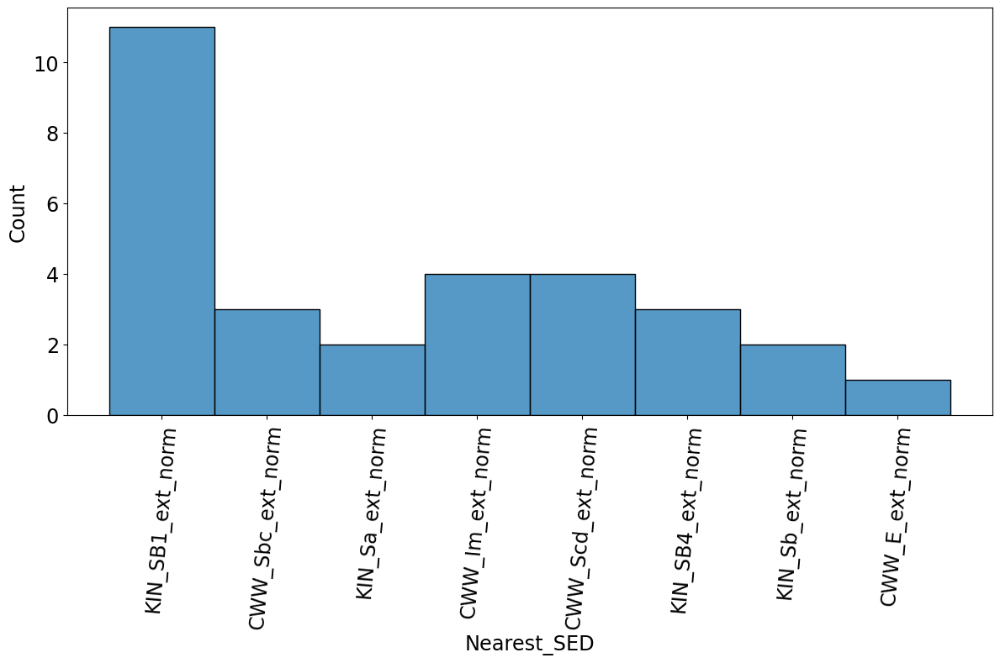

In [23]:
f,a = plt.subplots(1,1)
sns.histplot(data=df_refs_dist, x='Nearest_SED', ax=a)
a.tick_params(axis='x', rotation=85)
f.set_tight_layout(True)
all_figs = [f]

In [24]:
for key in df_refs_dist.index:
    nearest_SED = df_refs_dist.loc[key, 'Nearest_SED']
    _lambdas = np.array(df_cww_spec_normed['Wavelength'])
    _dists_to_nearest = np.empty_like([])
    for spec_id in clus_dict[key]:
        _spec_path = os.path.join(path_BC, f'SPEC{spec_id}_HZ4_BC.txt')
        _spec_arr = np.loadtxt(_spec_path)
        _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        _lumins = _spec_fonc(_lambdas)
        _mask = (_lambdas >= 0.)*(_lambdas <= 10000.)
        _norm = np.trapz(_lumins[_mask], _lambdas[_mask])
        normed_spec = _lumins/_norm
        _dists_to_nearest = np.append(_dists_to_nearest,\
                                      dist_spec(normed_spec, df_cww_spec_normed[nearest_SED], lambdas=_lambdas))
    _avg_dist_to_nearest = np.mean(_dists_to_nearest)
    _sigma_dist_to_nearest = np.std(_dists_to_nearest)
    df_refs_dist.loc[key, 'Avg_dist_to_nearest_SED'] = _avg_dist_to_nearest
    df_refs_dist.loc[key, 'Sigma_nearest_SED'] = _sigma_dist_to_nearest
    #print(key, new_clus_dict[key])
    #df_refs_dist.loc[key, 'Constituants_Dict'] = new_clus_dict[key]
df_refs_dist

,N_FORS2,Template_label,avg_z,sigma_z,dist_to_CWW_E,dist_to_CWW_Im,dist_to_CWW_Sbc,dist_to_CWW_Scd,dist_to_KIN_SB1,dist_to_KIN_SB2,dist_to_KIN_SB3,dist_to_KIN_SB4,dist_to_KIN_SB5,dist_to_KIN_SB6,dist_to_KIN_Sa,dist_to_KIN_Sb,Nearest_SED,Distance_to_nearest,Avg_dist_to_nearest_SED,Sigma_nearest_SED
KmeanCluster_SL_1,16,AVG_KmeanCluster_SL_1_normed,0.320742,0.158439,0.006933,0.004309,0.006347,0.005427,0.003661,0.003823,0.004477,0.004637,0.005284,0.005687,0.006791,0.006552,KIN_SB1_ext_norm,0.003661,0.003694,0.000524
KmeanCluster_SL_2,17,AVG_KmeanCluster_SL_2_normed,0.542816,0.195904,0.001408,0.002452,0.000757,0.001050,0.003539,0.003443,0.002168,0.001881,0.001450,0.001093,0.001234,0.000998,CWW_Sbc_ext_norm,0.000757,0.000832,0.000196
KmeanCluster_SL_3,30,AVG_KmeanCluster_SL_3_normed,0.500239,0.222361,0.004638,0.001448,0.003855,0.002739,0.001111,0.001343,0.001651,0.001839,0.002651,0.003075,0.004466,0.004200,KIN_SB1_ext_norm,0.001111,0.001236,0.000112
KmeanCluster_SL_4,56,AVG_KmeanCluster_SL_4_normed,0.483832,0.153515,0.000344,0.003617,0.000937,0.002096,0.004705,0.004587,0.003312,0.003022,0.002422,0.001945,0.000314,0.000485,KIN_Sa_ext_norm,0.000314,0.000362,0.000049
KmeanCluster_SL_5,11,AVG_KmeanCluster_SL_5_normed,0.385393,0.299869,0.001705,0.002951,0.000868,0.001363,0.004138,0.004028,0.002746,0.002487,0.001955,0.001417,0.001574,0.001502,CWW_Sbc_ext_norm,0.000868,0.000914,0.000141
KmeanCluster_SL_6,3,AVG_KmeanCluster_SL_6_normed,0.383923,0.055634,0.006616,0.005233,0.006214,0.005678,0.005185,0.005227,0.005283,0.005323,0.005629,0.005837,0.006510,0.006341,KIN_SB1_ext_norm,0.005185,0.005188,0.000176
KmeanCluster_SL_7,32,AVG_KmeanCluster_SL_7_normed,0.521392,0.150629,0.003817,0.000959,0.003011,0.001911,0.001446,0.001528,0.001066,0.001154,0.001910,0.002273,0.003643,0.003379,CWW_Im_ext_norm,0.000959,0.001087,0.000154
KmeanCluster_SL_8,32,AVG_KmeanCluster_SL_8_normed,0.416363,0.194216,0.005130,0.002118,0.004434,0.003385,0.001455,0.001701,0.002275,0.002458,0.003244,0.003688,0.004968,0.004705,KIN_SB1_ext_norm,0.001455,0.001549,0.000245
KmeanCluster_SL_9,37,AVG_KmeanCluster_SL_9_normed,0.395478,0.224168,0.000637,0.003570,0.000825,0.001982,0.004681,0.004560,0.003278,0.002990,0.002383,0.001870,0.000615,0.000727,KIN_Sa_ext_norm,0.000615,0.000625,0.000092
KmeanCluster_SL_10,17,AVG_KmeanCluster_SL_10_normed,0.581525,0.155705,0.001933,0.002016,0.001038,0.000581,0.003146,0.003062,0.001779,0.001505,0.001198,0.000902,0.001759,0.001532,CWW_Scd_ext_norm,0.000581,0.000779,0.000178


## Plot each cluster's template vs. its nearest CWW/Kinney SED

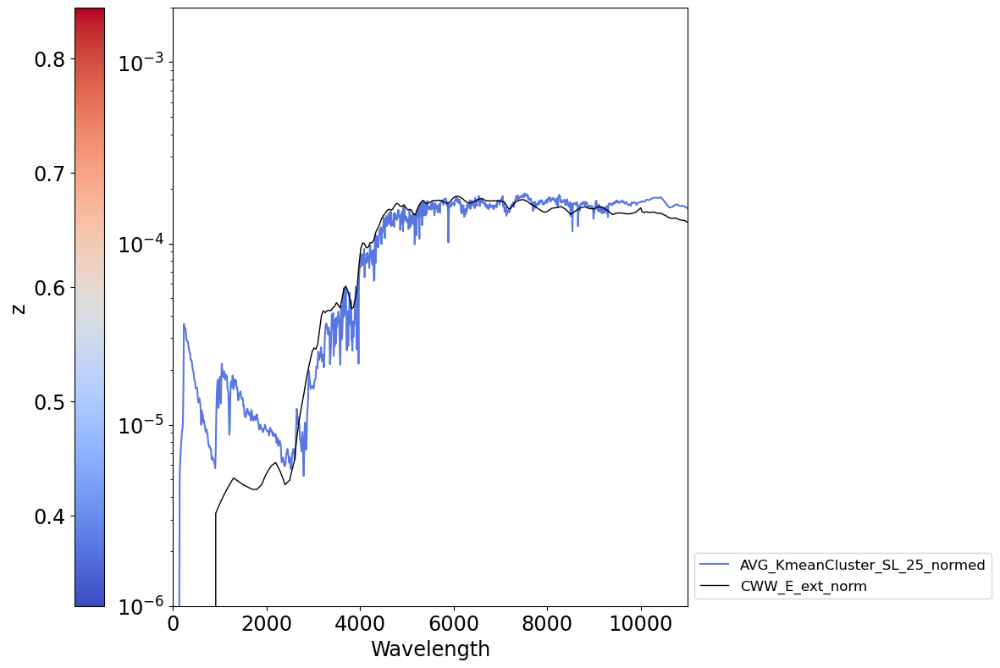

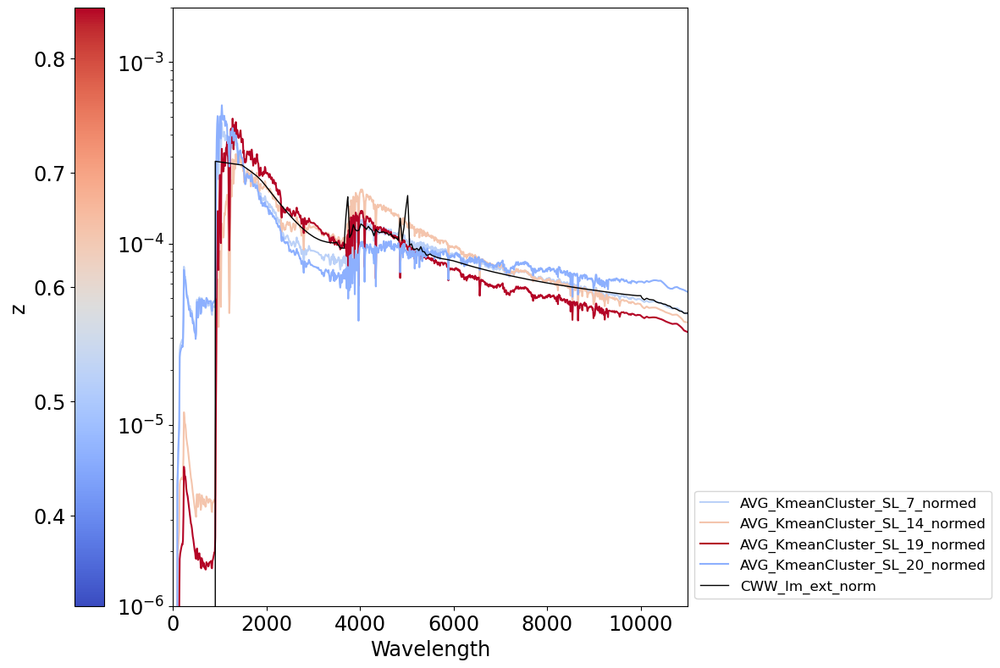

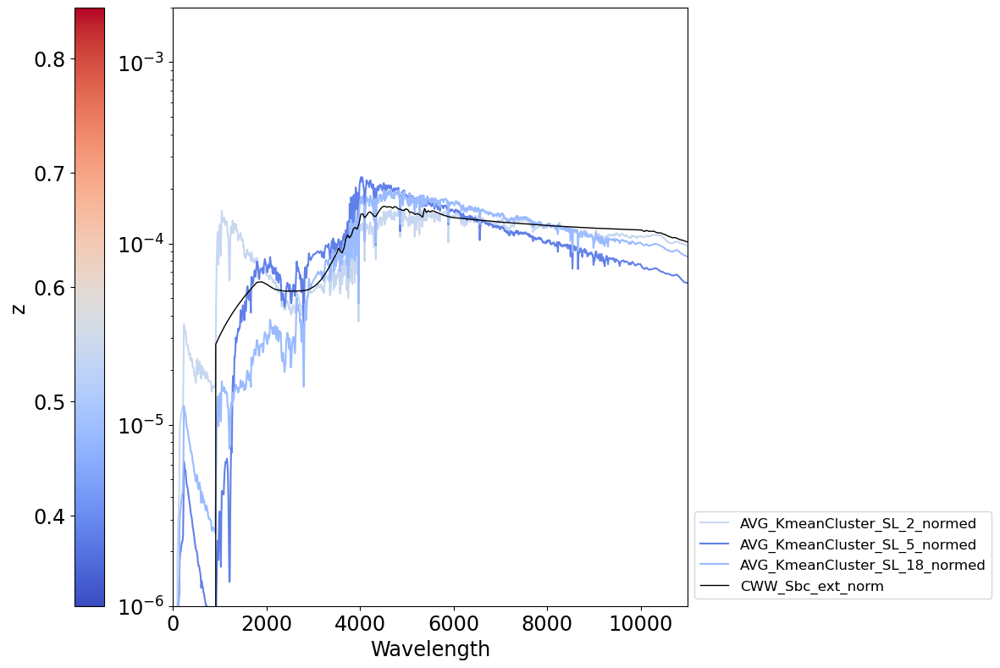

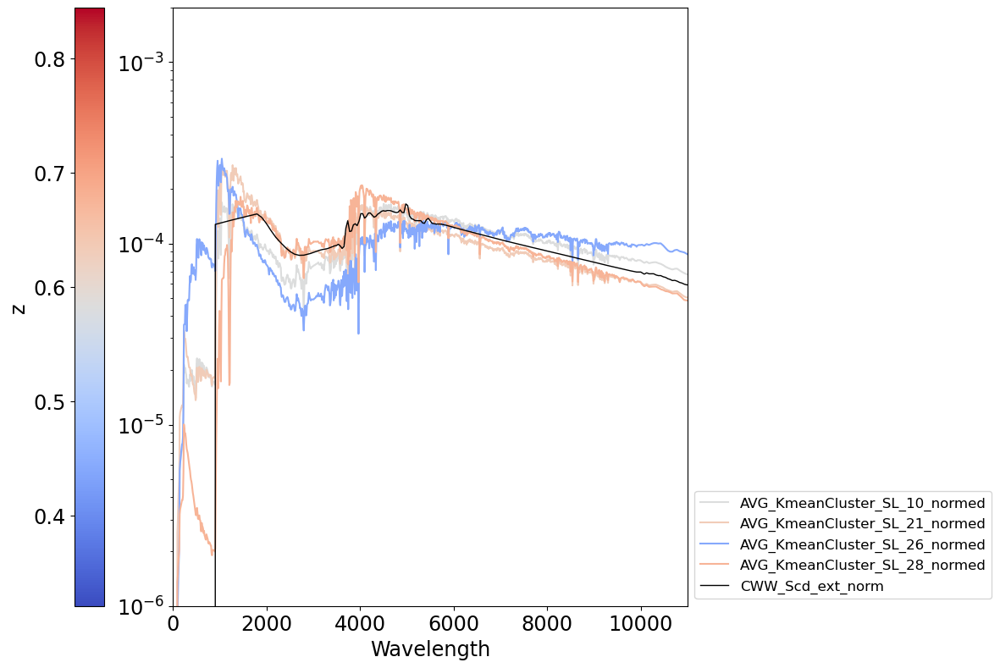

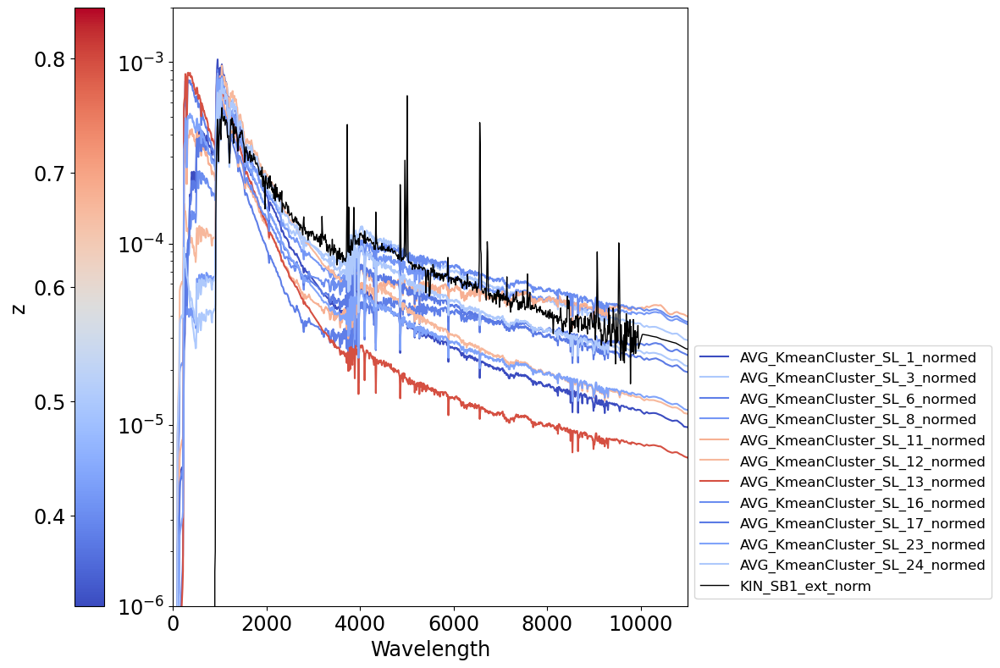

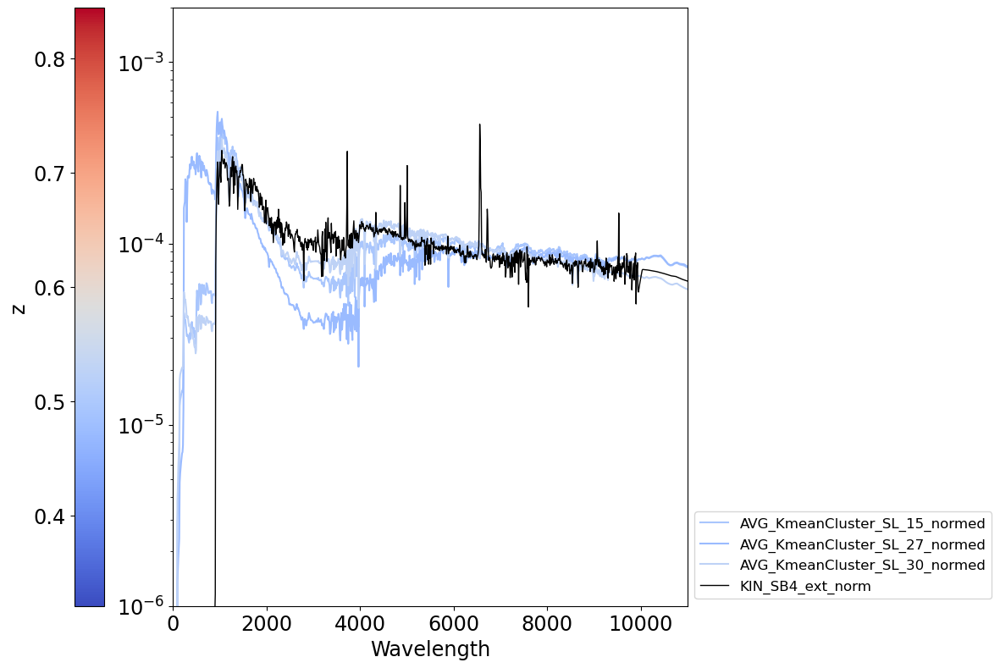

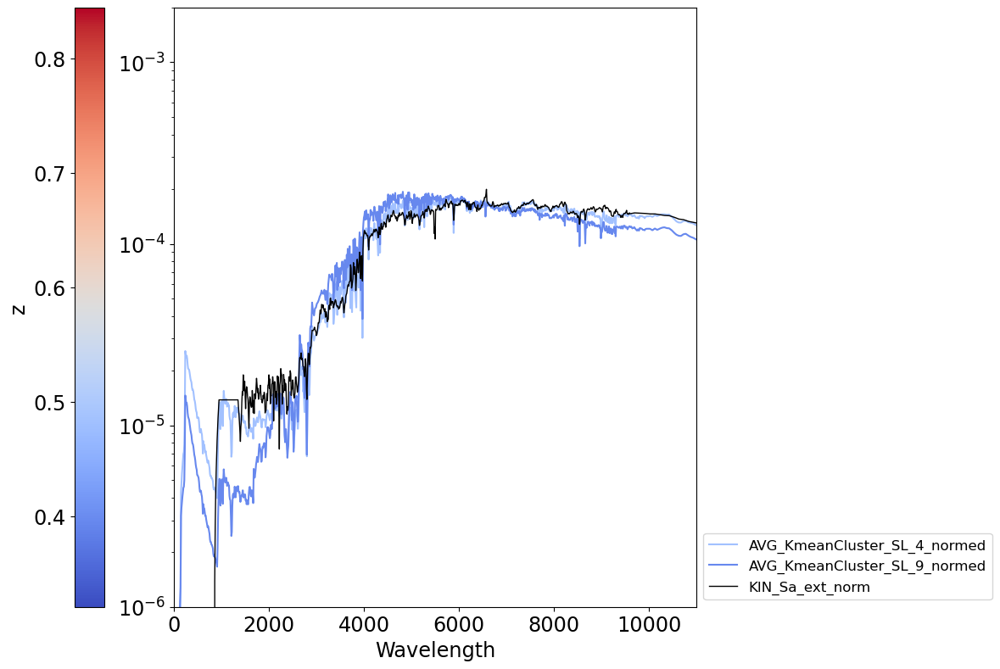

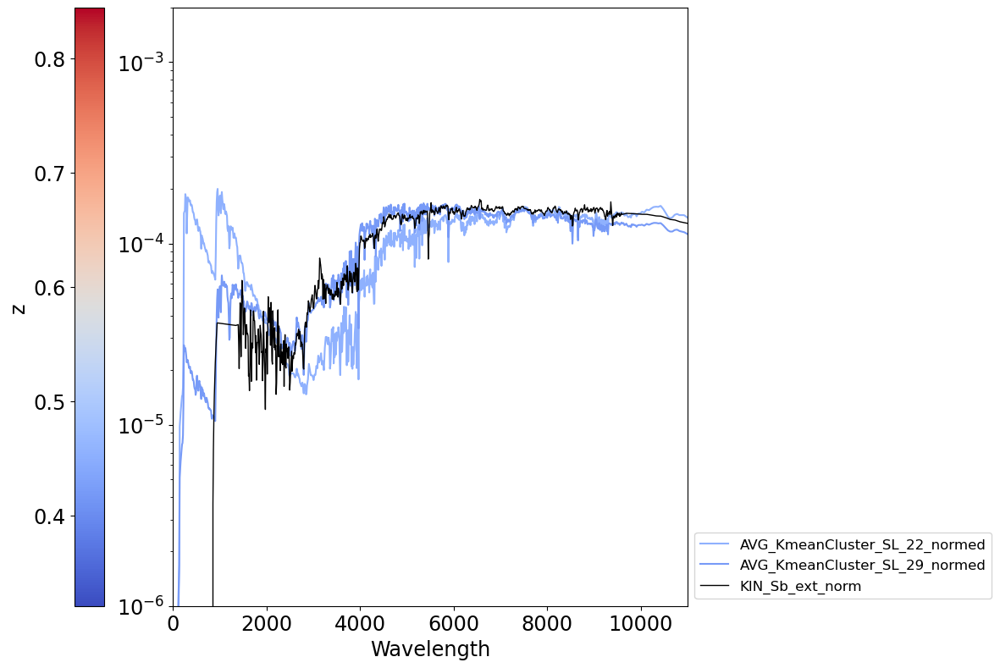

In [25]:
_zs = df_refs_dist['avg_z']
blu_red = plt.get_cmap('coolwarm')
cNorm = colors.Normalize(vmin=np.amin(_zs), vmax=np.amax(_zs))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=blu_red)
for ref in sorted(df_cww_spec_normed.keys()[1:]):
    _sel = (df_refs_dist['Nearest_SED'] == ref)
    _list_clus = list(df_refs_dist['Template_label'][_sel])
    __zs = df_refs_dist['avg_z'][_sel]
    N_plots = len(_list_clus)
    if N_plots > 0:
        f, a = plt.subplots(1,1)
        all_colors = scalarMap.to_rgba(__zs, alpha=1)
        df_avg_spec_normed.plot('Wavelength', _list_clus, color=all_colors, ax=a, legend=False)
        df_cww_spec_normed.plot('Wavelength', ref, ax=a, color='k', linewidth=1, legend=False)
        a.set_yscale('log')
        a.set_xlim(0, 11000)
        a.set_ylim(1.0e-6, 2.0e-3)
        a.legend(loc='lower left', bbox_to_anchor=(1.,0.))
        plt.colorbar(scalarMap, ax=a, label='z', location='left')
        f.set_tight_layout(True)
        all_figs.append(f)

In [26]:
if False:
    pdfoutputfilename = "KmeanClus_SEDs_vs_nearest_CWW.pdf"
    SaveImageInPdf(all_figs,pdfoutputfilename)

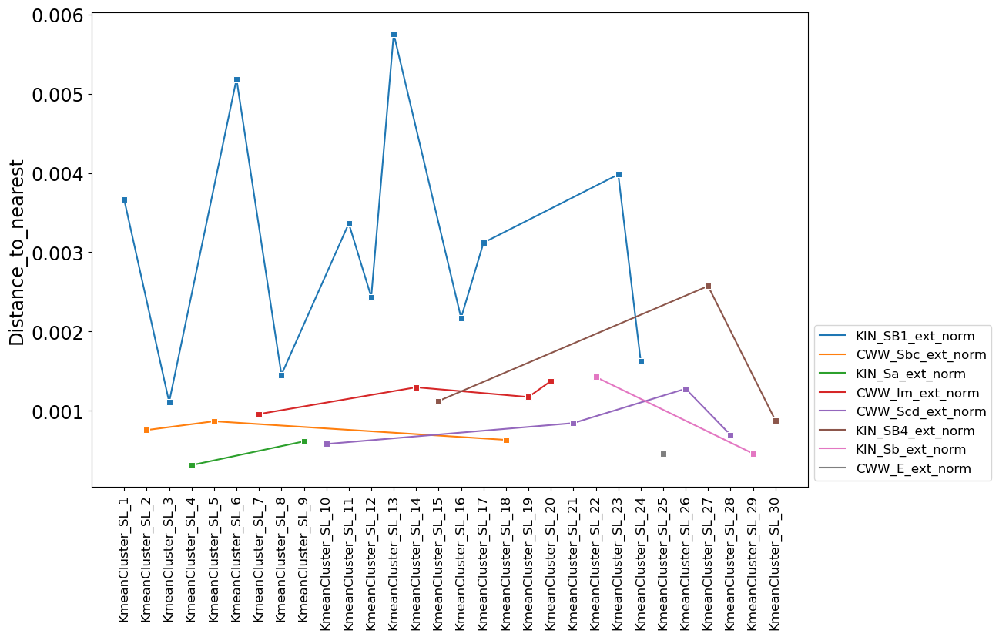

In [27]:
f,a = plt.subplots(1,1)
sns.lineplot(data=df_refs_dist, x=df_refs_dist.index, y='Distance_to_nearest',\
                hue='Nearest_SED',\
                ax=a,\
                marker='s'
               )
a.tick_params(axis='x', rotation=90, labelsize='large')
a.legend(loc='lower left', bbox_to_anchor=(1.,0.))

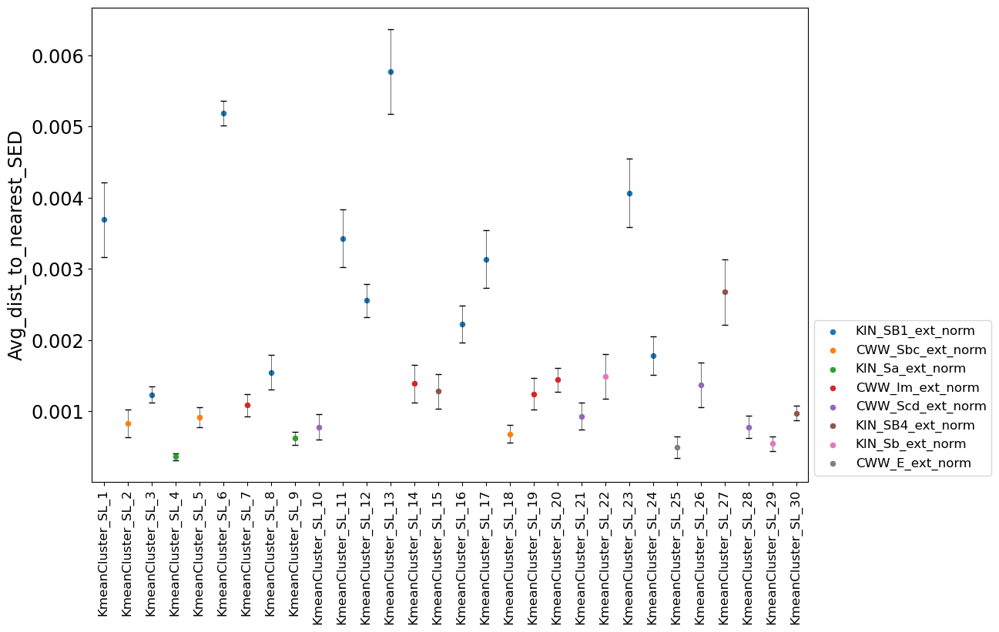

In [28]:
f,a = plt.subplots(1,1)
a.errorbar(x=np.arange(0,30), y=df_refs_dist['Avg_dist_to_nearest_SED'],\
           yerr=df_refs_dist['Sigma_nearest_SED'],\
           fmt='none',\
           elinewidth=0.4,\
           capsize=3,\
           ls='',\
           ecolor='k')
sns.pointplot(data=df_refs_dist, x=df_refs_dist.index, y='Avg_dist_to_nearest_SED', hue='Nearest_SED',\
              join=False,\
              ax=a, markers='.')
a.tick_params(axis='x', rotation=90, labelsize='large')
a.legend(loc='lower left', bbox_to_anchor=(1.,0.))

## Save relevant dataframes

In [29]:
df_avg_spec_normed.to_pickle('df_KmeanClus_avgSpec.pkl')
df_cww_spec_normed.to_pickle('df_CWW-Kin_spec.pkl')
df_refs_dist.to_pickle('df_NearestCWW-Kin_neighbours.pkl')

In [30]:
filepickle = './KmeanClustersFromSL_withZ.pkl'
with open(filepickle, 'wb') as f:
    pickle.dump(new_clus_dict, f)